# CNN Visualization

Cameron Ervin

Ben Brock

Jonathan Hunnicutt

## Overview

### The Importance of Interpretability within Neural Networks:
- Transparency: As neural networks, particularly deep learning models, are increasingly used in high-stakes decisions, the need for transparency becomes paramount. Interpretability ensures that the model's decision-making process is transparent and comprehensible to humans.
- Ethical and Fair Decision-Making: Interpretable models allow for the examination of the model's decisions for biases or unethical reasoning patterns, thereby promoting fairness and ethical decision-making.
- Regulatory Compliance: In many industries, regulations require explanations of algorithmic decisions. Interpretability directly addresses these requirements, making it possible to deploy advanced AI models in regulated domains.

### Why visualize CNNs?
- Understanding Model Decisions: Visualization techniques help researchers and practitioners understand how CNNs make decisions. This is particularly important in domains like medical diagnosis or autonomous driving, where understanding the reasoning behind a model's decision can be as critical as the decision itself.
- Debugging and Improving Models: By visualizing the activations and filters in CNNs, one can identify issues like overfitting to irrelevant features or failing to capture important patterns. This insight can guide the refinement of model architectures or data preprocessing steps to improve performance.
- Building Trust: When models can be interpreted and visualized, it builds trust among users and stakeholders. This is essential for deploying AI systems in sensitive or critical applications.

### Why use VGG19 to visualize CNNs?
VGG19 is a convolutional neural network model proposed by K. Simonyan and A. Zisserman from the University of Oxford in the paper "Very Deep Convolutional Networks for Large-Scale Image Recognition." VGG19 is similar to VGG16 except it has three additionally layers notated by the number associated with the model.

We chose VGG16 because of the following:
- VGG19 has a somewhat simple structure that will allow us to extract specific filters and inputs to filters
    - Simplicity: VGG19 is known for its simplicity, featuring only 3x3 convolutional layers stacked on top of each other in increasing depth. Reducing volume size is handled by max pooling. Convolution stride is fixed to 1 pixel; the spatial padding of convolution layer input is such that the spatial resolution is preserved after convolution, i.e., padding is 1 pixel for 3x3 conv. layers.
    - Depth: The network contains 19 convolutional layers and is very deep compared to its predecessors at the time of introduction. This depth is significant for learning the complex hierarchies of visual data. This depth helps in capturing both low-level features (such as edges and textures in the initial layers) and high-level features (such as object parts in deeper layers) effectively.
- VGG19 was trained on ImageNet which includes over 14 million images with more than 1 thousand categories
    - Robustness: VGG19, like many deep learning models, benefits significantly from pre-training on a large, diverse dataset like ImageNet. This pre-training helps the model to learn a broad range of features that can be effectively adapted to new tasks.

#### VGG19 Model Architecture

![image.png](https://cdn-images-1.medium.com/max/1600/1*cufAO77aeSWdShs3ba5ndg.jpeg)

* VGG-19 network has 16 Conv (Convolutional) layers and 3 FC (fully-connected) layers.
* The hyperparameters of each Conv layer are depicted as (in-channel, out-channel, filter-size, stride, padding). 
* There are 5 Maxpool layers with filter-size:2, stride:2, and padding:0

## Code

In [130]:
# tensorflow imports
import tensorflow as tf
from tensorflow.keras.applications.vgg19 import VGG19
from tensorflow.keras.applications.vgg19 import preprocess_input, decode_predictions
from tensorflow.keras.preprocessing.image import img_to_array, array_to_img, load_img
from tensorflow.keras import models
from tensorflow.keras import utils

# other imports
import numpy as np
import matplotlib.pyplot as plt
import scipy as sp
import requests
from io import BytesIO
from PIL import Image
import os
import math
import seaborn as sns

# helper imports
import helpers

### Verifying VGG19 works correctly:
Prior to jumping into our analysis of VGG19, lets first ensure our VGG19 network functions properly. Below are functions that we will use to verify that our model is working properly.

In [164]:
# taken from lecture notebook 04 LectureVisualizingConvnets.ipynb
def prepare_image_for_display(img, norm_type='max'):
    if norm_type == 'max':
        # min/max scaling, best for regular images
        new_img = (img - img.min()) / (img.max()-img.min())
    else:
        # std scaling, best when we are unsure about large outliers
        new_img = ((img - img.mean()) / (img.std() +1e-3))*0.15 + 0.5
        
    new_img *= 255
    new_img = np.clip(new_img, 0, 255)
    
    if len(new_img.shape)>3:
        new_img = np.squeeze(new_img)
        
    return new_img.astype('uint8')

# our main function to show that VGG19 is working correctly
def show_vgg_working(input_image):
    # convert input image parameter from an array of a webscraped image from our load_image_as_array function to a resized image
    image_resized = array_to_img(input_image).resize((224, 224))

    # convert back to an array
    image_array = img_to_array(image_resized)
    image_array = np.expand_dims(image_array, axis=0)  

    # preprocess image for VGG19
    image_preprocessed = preprocess_input(image_array)

    # declare our VGG19 model with imagenet weights
    model = VGG19(weights='imagenet')

    # make prediction for input image
    predictions = model.predict(image_preprocessed)

    # use decode_predictions to find correct imagenet class name
    decoded_predictions = decode_predictions(predictions, top=3)[0]

    # print top 3
    for i, (imagenet_id, label, score) in enumerate(decoded_predictions):
        print(f"{i + 1}: {label} ({score:.2f})")

    # display image using prepare_image_for_display function
    plt.imshow(prepare_image_for_display(input_image))
    plt.title('Actual Image From URL')
    plt.show()

def load_image_as_array(path, url=False):
    if url:
        size=(150, 150)
        response = requests.get(path) # download
        img = Image.open(BytesIO(response.content)) # open
        img = img.resize(size) # resize with PIL
        return np.array(img).astype(float) # return as numpy float array
    else:
        # Load and preprocess an image
        size=(224, 224)
        img = load_img(path, target_size=size)
        img_array = img_to_array(img)
        img_array = np.expand_dims(img_array, axis=0)
        return img_array

To show that our model works using the above functions, we will use two images sourced from the internet.

1/1 [==============================] - 0s 325ms/step


2024-03-21 18:10:43.459152: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


1: Great_Dane (0.62)
2: muzzle (0.37)
3: cloak (0.01)


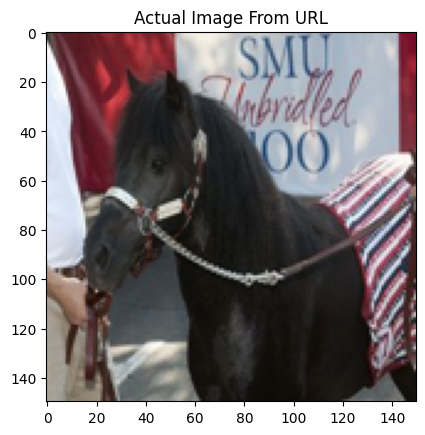

1/1 [==============================] - 0s 238ms/step


2024-03-21 18:10:47.312659: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


1: muzzle (1.00)
2: crash_helmet (0.00)
3: Staffordshire_bullterrier (0.00)


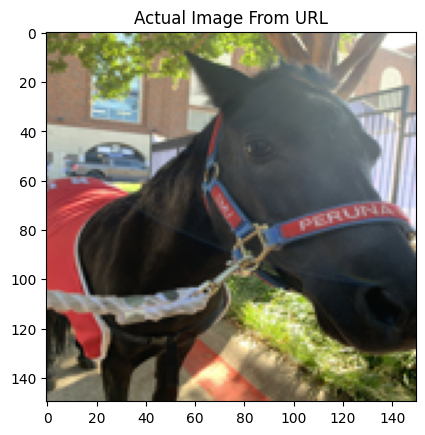

In [176]:
img_urls = ['https://i.pinimg.com/474x/8d/85/d8/8d85d84e93ad2b7428a27b971018a60d.jpg',
            'https://pbs.twimg.com/media/EHSB3LTW4AECFHX.jpg:large']

# calling our functions with our images
for img in img_urls:
    img_tensor = load_image_as_array(img, url=True)
    img_tensor /= 255.
    show_vgg_working(img_tensor)

We can verify that VGG19 is working since both predictions classify the images of SMU's very own mascot, Peruna, as a muzzle which is included in the two pictures. The first image has the highest probability prediction of great dane which also makes sense given the sharp ears and long face of a great dane.

### Now to select a multi-channel filter from a layer to visualize:

First, we will print out a summary of our model which includes all of the layers in the model. Then, we will select a layer to pick a multi-channel filter from.

In [133]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.applications.vgg19 import preprocess_input

# Load the pre-trained VGG16 model
model = VGG19(weights='imagenet', include_top=False, input_tensor=None)

# set VGG to be frozen
for layer in model.layers:
    layer.trainable = False

model.summary()

Model: "vgg19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, None, None, 3)]   0         
                                                                 
 block1_conv1 (Conv2D)       (None, None, None, 64)    1792      
                                                                 
 block1_conv2 (Conv2D)       (None, None, None, 64)    36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, None, None, 64)    0         
                                                                 
 block2_conv1 (Conv2D)       (None, None, None, 128)   73856     
                                                                 
 block2_conv2 (Conv2D)       (None, None, None, 128)   147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, None, None, 128)   0     

We will use block5_conv1 since it is still a mid-level portion of the network given there are convolutions before and after the layer. Also, since the layer is later in the network, the features picked up by our model will ideally be less abstract than the earlier layers. 

#### Selecting the specific multi-channel filter/feature from block5_conv1:

Now, we need to understand the dimensions and makeup of the aspects of our layer before we select the feature.

In [134]:
# lets look at the shapes of some of the filters above
keras_layer = model.get_layer('block5_conv1')
layer_output = keras_layer.output
weights_list = keras_layer.get_weights() # list of filter, the biases
filters = weights_list[0]
biases = weights_list[1]

# print out some specifics of how the filter is saved
print('block5_conv1 activation size is ', layer_output.get_shape(), '(batch x H x W x filter)')
print('block5_conv1 filters is of shape',filters.shape, '...(k x k x channels x filters)')
print('block5_conv1 biases is of shape',biases.shape)

idx = 32
print('one filter in block5_conv1 is ', filters[:,:,:,idx].shape )
channel = 2
print('one channel in the the filter is', filters[:,:,channel,idx].shape)
print('The weights of that channel in the filter are:\n', filters[:,:,channel,idx])
print('The bias of the filter is:',biases[idx])

block5_conv1 activation size is  (None, None, None, 512) (batch x H x W x filter)
block5_conv1 filters is of shape (3, 3, 512, 512) ...(k x k x channels x filters)
block5_conv1 biases is of shape (512,)
one filter in block5_conv1 is  (3, 3, 512)
one channel in the the filter is (3, 3)
The weights of that channel in the filter are:
 [[ 0.00590394  0.00144029 -0.00634174]
 [-0.00029915 -0.00210039 -0.00649981]
 [-0.00318095  0.00470829  0.00409335]]
The bias of the filter is: -0.07167267


Therefore, we know we have 512 possible multi-channel filters to choose from in block5_conv1. Each multi-channel filter in block5_conv1 has the dimensions (3, 3, 512) for (k, k, channels), and each one channel filter in our feature has the dimensions of (3, 3, 1) for (k, k, 1 channel). Since this is quite a few features to go through, we will now use [OpenAI's Microscope](https://microscope.openai.com/models/vgg19_caffe?models.technique=deep_dream) to visualize which image maximally excites each of our 512 filters. We will pick based off these images.

After exploring Microscope, [Feature 8](https://microscope.openai.com/models/vgg19_caffe/conv5_1_conv5_1_0/8) of block5_conv1 is optimally excited by circular features of an image.

![title](https://github.com/cameronervin/NN-Projects/blob/main/lab3/graphs/channel-8.png?raw=true) ![title](https://github.com/cameronervin/NN-Projects/blob/main/lab3/graphs/channel-8-3.png?raw=true) ![title](https://github.com/cameronervin/NN-Projects/blob/main/lab3/graphs/channel-8-2.png?raw=true) 



Let's continue to explore Feature 8. **We will choose Feature 8 as our multi-channel filter for analysis.**

#### Optimally exciting this feature with gradient ascent:

We will use the following function to find an image that optimally excites our chosen feature.

In [150]:
# taken from lecture notebook 04 LectureVisualizingConvnets.ipynb
def generate_pattern(layer_name, filter_index, size=150):
    # Build a model that outputs the activation
    # of the nth filter of the layer considered.
    layer_output = model.get_layer(layer_name).output
    # Isolate the output 
    new_model = models.Model(inputs=model.input, outputs=layer_output)
    
    # We start from a gray image with some uniform noise
    input_img_data = np.random.random((1, size, size, 3)) * 20 + 128.
    
    I_start = tf.Variable(input_img_data, name='image_var', dtype = 'float64')
    I = preprocess_input(I_start) # only process once
    # Run gradient ascent for 40 steps
    eta = 1.
    for i in range(100):
        with tf.GradientTape(watch_accessed_variables=False) as tape:
            tape.watch(I)
            # get variable to maximize 
            model_vals = new_model(I) 
            filter_output = tf.reduce_mean(model_vals[:, :, :, filter_index])

        # Compute the gradient of the input picture w.r.t. this loss
        # add this operation input to maximize
        grad_fn = tape.gradient(filter_output, I)
        # Normalization trick: we normalize the gradient
        grad_fn /= (tf.sqrt(tf.reduce_mean(tf.square(grad_fn))) + 1e-5) # mean L2 norm
        I += grad_fn * eta # one iteration of maximizing
        
    # return the numpy matrix so we can visualize 
    img = I.numpy()
    return prepare_image_for_display(img, norm_type='std')

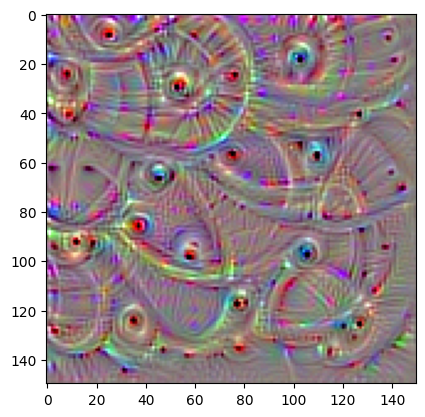

In [136]:
plt.imshow(generate_pattern('block5_conv1', 8))
plt.show()

Our optimally excited image for the feature looks similar to the images from Microsope. The images not being the exact same might stem from different optimization techniques. Again we see circular shapes with smaller circular centers.

#### Sending images of various ImageNet classes through our filter:

The following functions will be used to help find which ImageNet classes, on average, optimally excite our feature.

Since ImageNet is around 150 GB, we downloaded an abbreviated version of ImageNet from [Kaggle](https://www.kaggle.com/datasets/deeptrial/miniimagenet). This mini version of ImageNet includes all 1000 classes but only a subset of 2-5 images from each class per folder.

In [2]:
dataset_directory = 'data/ImageNet-Mini/images'
json_file_path = 'data/ImageNet-Mini/imagenet_class_index.json'
# rename folder names rather than using decoder
helpers.rename(dataset_directory, json_file_path)

We will now load our images in from our local storage and create a dictionary with the folder/label names as the dictionary keys and the image names and arrays as the values.

In [197]:
images_dict = {}

# open dataset folder and iterate through each folder name
for folder_name in os.listdir(dataset_directory):
    original_folder_path = os.path.join(dataset_directory, folder_name)

    # check if it's a directory
    if not os.path.isdir(original_folder_path):
        continue

    folder_images = []

    # process all images in folder, number of images per folder varies between 2-5
    for image_name in os.listdir(original_folder_path):
        image_path = os.path.join(original_folder_path, image_name)
    
        # convert to an array
        input_image = load_image_as_array(image_path)

        folder_images.append([image_name, input_image])

    images_dict[folder_name] = folder_images

Defining our classes to find which images and classes maximally excite our feature.

In [207]:
def find_top_classes(model, layer_name, idx, top_n=10):
    layer_output = model.get_layer(layer_name).output
    new_model = models.Model(inputs=model.input, outputs=layer_output)  

    results = []
    for folder in images_dict:
        class_results = []
        for name, image in images_dict[folder]:
            activation = new_model.predict(image, verbose=0)
            class_results.append(activation[:,:,idx])
        class_grad_mean = np.mean(class_results)
        results.append([folder,class_grad_mean])

    results.sort(key=lambda x: x[1], reverse=True)

    return results[:top_n]

def find_top_images(model, layer_name, idx, top_n=10):
    layer_output = model.get_layer(layer_name).output
    new_model = models.Model(inputs=model.input, outputs=layer_output)  

    results = []
    for folder in images_dict:
        for name, image in images_dict[folder]:
            activation = new_model.predict(image, verbose=0)
            results.append([folder, name, activation[:,:,idx]])

    results.sort(key=lambda x: x[1], reverse=True)

    return results[:top_n]

Finding our top classes and images.

In [208]:
# selected layer
layer_name = 'block5_conv1'
# selected filter
filter_index = 8

top_classes = find_top_classes(model,layer_name,filter_index)
top_images = find_top_images(model,layer_name,filter_index)

2024-03-21 21:30:58.386604: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-03-21 21:35:03.705714: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


Let's visualize our results.

In [215]:
helpers.print_table(top_classes)

+--------------+------------------+
| Class        |   Avg Activation |
+==============+==================+
| envelope     |          88.7232 |
+--------------+------------------+
| pinwheel     |          85.0655 |
+--------------+------------------+
| basketball   |          84.5569 |
+--------------+------------------+
| bassoon      |          83.5039 |
+--------------+------------------+
| packet       |          82.9753 |
+--------------+------------------+
| mailbox      |          82.8003 |
+--------------+------------------+
| croquet_ball |          82.5618 |
+--------------+------------------+
| Model_T      |          80.5102 |
+--------------+------------------+
| zucchini     |          80.3887 |
+--------------+------------------+
| lens_cap     |          80.0381 |
+--------------+------------------+


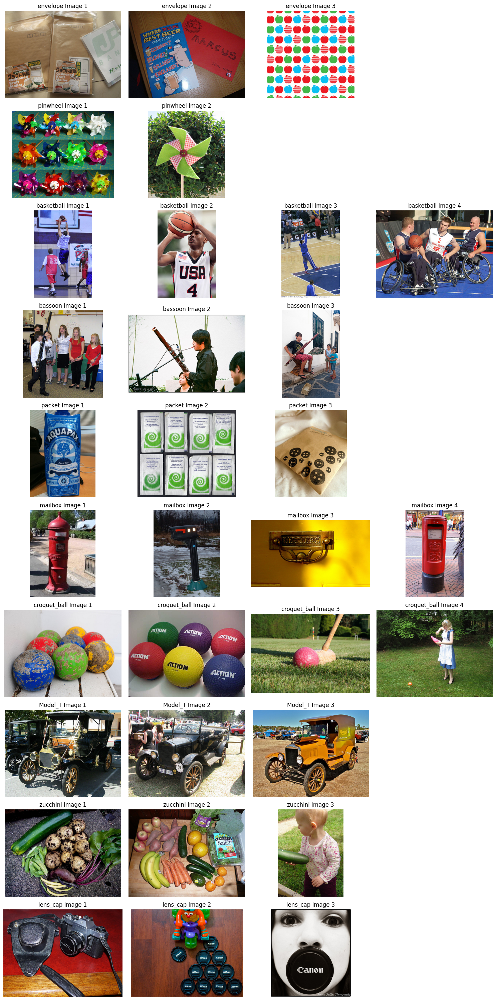

In [229]:
# printing the images in our top 3 classes
helpers.display_top_images(dataset_directory, top_classes)

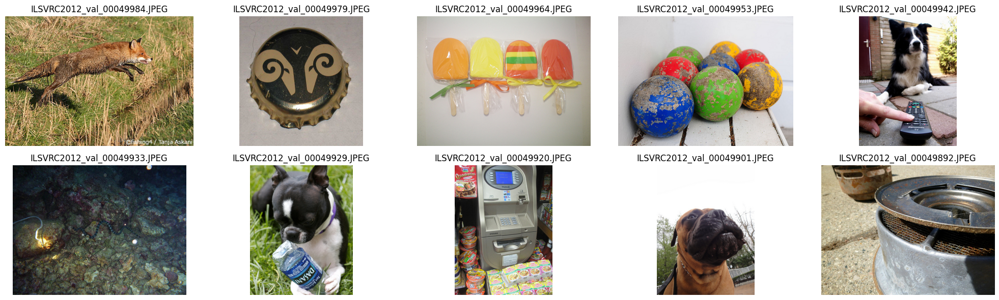

In [237]:
helpers.display_images(dataset_directory, top_images)

##### Interpreting our top classes and images:
Our results support our initial thought process that the feature looks to be capturing round edges and circles. Across both the images for our top classes and our top images, the main characteristic of almost all of the images are some sort of circular or close to circular component to the picture. 

For instance, in our top classes, circles and round edges are seen prominently. Envelope Image 3, for example, most likely boosts the average activation of the envelope class with its grid of circle-like apples. Furthermore, other images from our top classes such as pinwheel Image 1 & 2, basketball Image 1-4, packet Image 1-3, croquet_ball Image 1-4, Model_T Image 1-3, zucchini Image 1 & 2, and lens_cap Image 1-3 all feature circular components. As far as the images, that are not as obviously circular, these could be including circular features that we migh not necessarily pick up on or the images could be boosted on average by another image with a higher activation such as the envelopes.

Additionally, amongst our top 10 images, the bottle cap, popsicles, croquet balls, atm machine, and car wheel all include very large or several circles. As far as the images that might include circular components as obviously, one could make an argument that the feature is picking up on circular edges we might not pay the most attention to such as the shapes the grass create in the fox image, the buttons on the remote, the shapes in the rocks of the sea floor, and the circular-ness of the dog heads/noses/eyes.

**Hypothesis:**

**Therefore, after examining the image that optimally excites our feature both through Microscope and our own optimization as well as finding which classes and individual images most activate our feature, we believe that our feature especially picks up on circular objects/ components in images.**

### Analyzing each channel of our feature to understand how this might form a circuit:

In order to analyze each filter in our multi-channel filter, we will extract the filter coefficients for each input activation to our multi-channel filter and keep the top ten inputs with the strongest weights.

First, let's understand the dimensions and makeup of the aspects of the inputs to our layer.

In [142]:
keras_layer = model.get_layer('block5_conv1')
layer_input = keras_layer.input
weights_list = keras_layer.get_weights() # list of filter, the biases
filters = weights_list[0]
biases = weights_list[1]

print('block5_conv1 input size is ', layer_input.get_shape(), '(batch x H x W x filter)')
print('block5_conv1 filter coefficients are of shape',filters.shape, '...(k x k x channels x filters)')

block5_conv1 input size is  (None, None, None, 512) (batch x H x W x filter)
block5_conv1 filter coefficients are of shape (3, 3, 512, 512) ...(k x k x channels x filters)


We have 512 inputs into our feature with size (3, 3, 512).

Next, we will find the L2 normalized weights of each of these 512 filter inputs and sort these normalized weights to find the top 10 strongest filter inputs, regardless of if these inputs are positive or negative.

In [143]:
idx = 8
filter_list = []

for i in range(512):
    filter_coefficients = filters[:,:,i,idx]
    norm_coef = np.linalg.norm(filter_coefficients)

    filter_list.append([i,norm_coef])

filter_list.sort(key=lambda x: x[1], reverse=True)
top_ten = filter_list[:10]
top_ten

[[338, 0.06387114],
 [506, 0.05237433],
 [186, 0.050160002],
 [355, 0.049797006],
 [56, 0.04678901],
 [326, 0.046288397],
 [178, 0.04557392],
 [78, 0.045409307],
 [416, 0.044597197],
 [389, 0.04308579]]

Now that we have our filters, lets visualize the actual weights of each input filter.

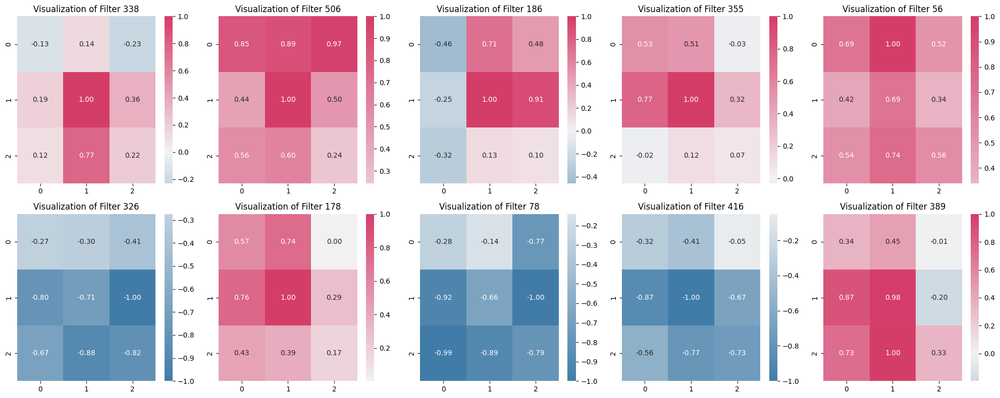

In [144]:
# create a figure to hold the grid of plots
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(20, 8))

# loop through top_ten filters and plot each
for i, (channel, norm) in enumerate(top_ten):
    ax = axes[i // 5, i % 5]  # calculate grid position
    helpers.visualize_matrix_seaborn(channel, filters[:,:,channel,idx], ax)

plt.tight_layout()
plt.show()

<a id='visualized-filters'></a>
It appears that we have 7 filters that are mostly positive (pink) and 3 filters that are mostly negative (blue). As expected, we do not have any filters that are mostly neutral (white) since we chose the top 10 strongest reacting filters. The positive matrices can be categorized as mostly excitatory since they have strong positive weights, and the negative matrices can be categorized as mostly inhibitory since they have strong negative weights.

Next, we verify these categorizations and create our category groups.

In [145]:
def categorize_matrix(matrix):
    # flatten the matrix to make it easier to work with
    flat_matrix = [item for sublist in matrix for item in sublist]
    
    # count positive and negative values
    positive_count = sum(1 for x in flat_matrix if x > 0)
    negative_count = sum(1 for x in flat_matrix if x < 0)
    
    # determine the category based on counts
    if positive_count > negative_count:
        return "mostly positive"
    elif negative_count > positive_count:
        return "mostly negative"
    else:
        return "balanced"

In [154]:
excitatory = []
inhibitory = []
neutral = []

# also create list of all of our filter numbers for later use
filter_nums = []

for filter in top_ten:
    channel, norm = filter

    filter_nums.append(channel)

    category = categorize_matrix(filters[:,:,channel,idx])

    if category == 'mostly positive':
        excitatory.append(filter)
    elif category == 'mostly negative':
        inhibitory.append(filter)
    else:
        neutral.append(filter)

print(f'Number of mostly excitatory filters - {len(excitatory)}\nNumber of mostly inhibatory filters - {len(inhibitory)}\nNumber of neutral filters - {len(neutral)}')
print(f'\nExcitatory filters: {[channel for channel, norm in excitatory]}')
print(f'Inhibitory filters: {[channel for channel, norm in inhibitory]}')
print(f'Neutral filters: {[channel for channel, norm in neutral]}')

Number of mostly excitatory filters - 7
Number of mostly inhibatory filters - 3
Number of neutral filters - 0

Excitatory filters: [338, 506, 186, 355, 56, 178, 389]
Inhibitory filters: [326, 78, 416]
Neutral filters: []


<a id='excitatory-inhibitory-filters'></a>
We confirm that we have 7 mostly excitatory filters, 3 mostly inhibitory filters, and 0 neutral filters in our top 10 strongest reacting filters of our feature.

### Using image gradient techniques to visualize our top 10 filters:

Using a similar technique to before, we will find which images maximally excite our top 10 filters we just found. We will use these images along with all of the previous images to make assumptions on our circuit and how it works. From there, we will define properties of our circuit and relate our assumptions back to our original hypothesis.

To find the images that maximally excite our top ten filters, we will use gradient ascent to maximally excite the corresponding features in the previous layer. For example, we will use the generate pattern function on feature 338 from the pervious layer to find the image that maximally excites filter 338 of the current layer and feature.

<a id='opt-excit-images'></a>
Now, to find the images that excite our top 10 filters.

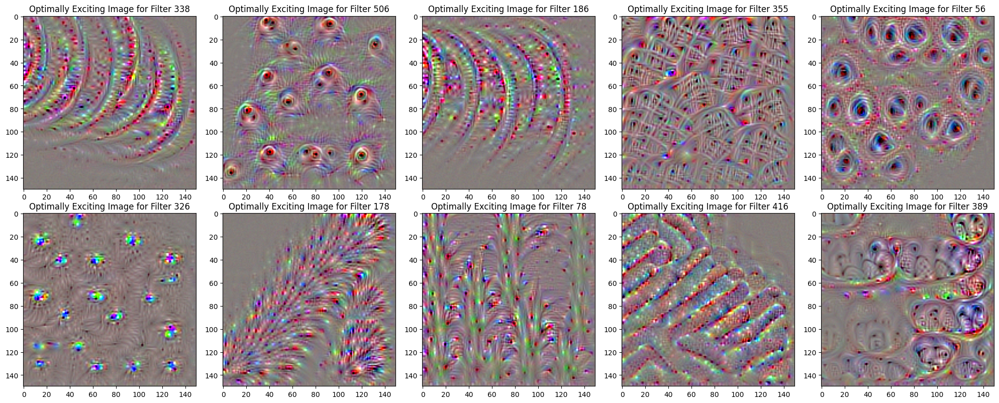

In [160]:
plt.figure(figsize=(20, 8))

for i, filter in enumerate(filter_nums):
    plt.subplot(2, 5, i + 1)
    plt.imshow(generate_pattern('block4_pool', filter))
    plt.title(f'Optimally Exciting Image for Filter {filter}')

plt.tight_layout()
plt.show()

#### Analyzing how this circuit works:
After refering back to our [visualized filters](#visualized-filters), [lists of excitatory/inhibitory filters](#excitatory-inhibitory-filters), and our [optimally exciting images](#opt-excit-images) for each filter, we can start to piece together how we think this circuit works. 

**When we bring all of our excitatory images together, we suspect that our circuit detects different circular objects with a defined circular center.** If we take a look at our most excitatory filters, [338, 506, 186, 355, 56, 178, 389], we can help determine what our feature is detecting. It appears each of these filters captures different components of circular edges. For instance, we could group 338 and 186 together into a family since both appear to capture long vertical curves, of slightly different sizes, both capture portions of circular objects which might not fill the screen. Filters 506 and 56 also appear like we could group them together into a family, with both capturing different size eyes/smaller circles. 506 is most excited by small eyes, while 56 is most excited by circles within circles, such as large eyes or concentric circles. Lastly, we have filters 355, 178, and 389. Each of these filters also appears to be focusing on different components of an image. Filter 178 seems to be capturing organic looking lines that radiate out from a center, the most commonly excitatory image is a flower.  Filters 355 and 389 seem to be manufactured radial images, like wheels with spokes and faces of a clock, though 355 prefers linear objects radiating out from a center, while 378 prefer circular objects orbiting a center. All of our exhitatory filters capture either curved edges or a defined center of a circular object.

**After performing a similar analysis on our inhibitory filters, we suspect that our circuit does not detect non circular objects and linear objects.** Now, when looking at our inhibitory filters, [326, 78, 416], we can help determine what our feature is not detecting. Filter 326 seems similar to filters 506 and 56, however, the circles in the image do not have a defined center. The most exciting images are almost all red/orange eyes or red lights, or small red balls (like 9 balls in pool).  Inhibiting Filter 326 then perhaps excludes things that could be confused for circles/balls/wheels/spheres, specifically red lights. Filter 78 also does not include very fine circular features, but the most exciting images include some curve element, but rarely a circular object.  Inhibiting Filter 78 then perhaps distinguishes between actual circles and instead of curved objects.  Finally, Filter 416 includes thick lines positioned side by side linearly, with linearly repeated slight curves. The most exciting images for this filter are coiled things like snakes, spirals, or braided rope. These are somewhat curved but very different from purely circular objects. Overall, the three most inhibitory filters then contain curved objects that are not circles/balls/wheels/spheres, thus helping the algorithm distinguish between kinds of curvey objects.

It appears that our circuit pulls together several different features from the previous layer to maximally detect circular objects of non-small size with a defined center such as a car wheels and clocks.

Downstream, since the most exciting images for the original 5_1 unit 8 are all car wheels, this circuit seems to detect manufactured circular objects like wheels, which would help the algorithm detect cars or other wheeled objects.

#### Defining properties of our circuit:

Our circuit is pure and pose invariant. Our circuit is pure rather than polysemantic since it only detects one type of feature - circular objects. This is a result of our different families of curve detectors within our circuit. Additionally, our circuit is pose invariant somewhat by default since circular objects themselves are pose invariant. That is, our circuit detects circular images regardless of their orientation within the image. However, the circuit is pose invariant in the sense of angle invariant, whereby it can detect a flat circular object (like a wheel) from any angle.  Since a circle at an angle becomes an oval, the circuit must distinguish between oval like curves vs circles viewed from an angle. According to our optimally exciting image for feature 8, our circuit also detects circles in superposition as seen by the numerous centers and circular objects in our image.

#### Relating our visualizations back to our original hypothesis:

Our visualizations and further analysis support our hypothesis. We have determined that our circuit is comprised of different curve detectors that create a pure, pose invariant circular object detecting feature with feature 8. When examining our most excitatory filters, we found that there are different families of filters that detect curves and circular centers, and ovals that could be circles. Additionally, our most inhibitory filters excluded curves with oval like features which were not actually circular. In conclusion, our visualizations support our hypothesis that our feature detects circular components in images. Further support of our hypothesis can be seen below with the images that OpenAI's microscope classified as the largest activations per image from the original ImageNet dataset:

![title](https://github.com/cameronervin/NN-Projects/blob/main/lab3/graphs/channel_8_40.png?raw=true)

##### References:
- [Lecture Notebook](https://github.com/8000net/LectureNotesMaster/blob/master/04%20LectureVisualizingConvnets.ipynb)
- [OpenAI's VGG19 Mircoscope](https://microscope.openai.com/models/vgg19_caffe?models.technique=deep_dream)
- [Kaggle Mini ImageNet](https://www.kaggle.com/datasets/deeptrial/miniimagenet)
- [Weight Visualization Style](https://storage.googleapis.com/distill-circuits/inceptionv1-weight-explorer/mixed3b_379.html)
- [Distill Circuits](https://distill.pub/2020/circuits/zoom-in/)
- [Kaggle Mini ImageNet](https://distill.pub/2020/circuits/zoom-in/)
- ChatGPT4